# Diabetic Retinopathy Classification using Neural Networks (CNN)

# Primary Observations

- Diabetic retinopathy is a medical condition wherin the walls of the blood vessels in your retina weaken.

- In the early stages of diabetic retinopathy, the walls of the blood vessels in your retina weaken. Tiny bulges protrude from the vessel walls, sometimes leaking or oozing fluid and blood into the retina. Tissues in the retina may swell, producing white spots in the retina. As diabetic retinopathy progresses, new blood vessels may grow and threaten your vision.

- Several stages of the disease and their respective labels in the dataset are mentioned below:

            0 - No DR

            1 - Mild

            2 - Moderate

            3 - Severe

            4 - Proliferative DR

- Here the classes are not completely distinct (nominal which are upon no scales to compare) like a cat dog classification. The data are relative with severity (ordinal). Hence should be treated different.

- So in our case the observation with the images provided and the conditions' understanding are occurance of small spots which are concentration or incoming fluids density difference. 
Hence better clarity should be given to the model to identify the size of the spots or structures for better classification of the severity. 

# Dataset

The dataset issued for the aptos competition 2019 consisted of 
- 3662 labelled train images with labels in the csv file for training and 
- 1928 unlabelled images for prediction. 

Initially the data is read mapped with labels in the csv file and then the read csv files are split into train, test and validation splits. The ratio of the split was maintained at test size = 0.3. 
Stratify based on labels is used to maintain the mix or proportion of all categories are present in all the splits.

# Open and Load Images or dataset

Based on the observation, the csvs contain the labels and the photo ids. 
- Train test split is performed in the csvs and then their respective values can be mapped with the id in the csv file.
- Here I have used the open cv library to read the images and then albumentations library to transform the images.

**DatasetClass**
- Firstly the id and label are tapped from the csv file, then the id is sent along with the file format and is concatenated as string along with the data directory followed by file format like jpeg, png etc. 
- Then the cv2 command 'imread' is used to open the images and convert them to arrays. 

**Preprocess**
- Then the format is changed from bgr to rgb which is its default return type. Also in some grayscale images are used. 
- Then the respective labels are extracted and are attac
- Then post opening the image it is sent to the transforms method and then brought back in. 
- The return value of the method contains image tensors and which can be later unpacked if needed.

**DataLoader**
- The processed data from the above step are passed through data loader to split into batches and shuffle the dataset to add some more randomness.
- Post the data loader the output was in the form of list of tensors of all batches input data, tensors of all labels.
Here the parameters used are batch size 1 for most models. Often batch sizes are kept low to 

# Experiments Table

- Initially we did all right and were doing it with a shuffle in the prediction dataset, which lead to mismatch of labels and ids. And the kappa scores were also too low like 0.0089 in submissions both public and private. Then it was found and changed to get better results as below.

So firstly the data is trained with minimum preprocessing like converting to tensors and then experimented further with augmentations and different other possibilities.

# With Basic Augmentations

| Trial | Model                | Experiment | Size | Epochs | Train Kappa | Test Kappa | Validation Kappa | Private Score | Public Score |
| ----- | -----                | ---------- | ---- | ------ | -------------- | ------------- | ------------------- | ------------ | ------------- |
|   Best   | SeResNext50_32x4d | Resizing, tensor, sharpen + least loss | 512 | 10 | 0.74217 | 0.69401 | 0.67644 | 0.863467 | 0.649313 |
|   1   | SeResNext26d_32x4d   | Resizing, tensor + best kappa | 224 | 9 | 0.847368 | 0.83590 | 0.82536 | 0.854206 | 0.660446 |
|   2   | tf efficientnet v2b3 | Resizing, tensor, sharpen | 512 | 6 | 0.76123 | 0.77956 | 0.75432 | 0.836953 | 0.681245 |
|   3   | SeResNext26d_32x4d   | Resizing, tensor, sharpen + least loss | 224 | 11 | 0.77723 | 0.78915 | 0.737066 | 0.835079 | 0.660425 |
|   4   | Inception_resnet_v2  | Resizing, tensor, sharpen + least loss | 512 | 11 | 0.78424 | 0.77248 | 0.742394 | 0.826997 | 0.667065 |
|   5   | Efficientnet b0      | Resizing and convert to tensor | 512 | 15 | 0.83469 | 0.88636 | 0.880118 | 0.82232 | 0.560797 |
|   6   | Inception V3         | Resizing, tensor, sharpen + best kappa | 512 | 7 | 0.83415 | 0.88769 | 0.88004 | 0.816187 | 0.528484 |
|   7   | ResNet50             | Resizing and convert to tensor | 512 | 15 | 0.75954 | 0.87090 | 0.872545 | 0.78086 | 0.468281 |
|   8   | SEResNet101          | Resizing and convert to tensor | 224 | 10 | 0.764354 | 0.694564 | 0.704622 | 0.436233 | 0.015804 |
|   9   | EfficientNet_b0      | Resizing and convert to tensor, consider as regression | 224 | 10 | 0.764354 | 0.694564 | 0.704622 | 0.436233 | 0.015804 |

# With Augmentations

| Trial | Model                | Experiment | Size | Epochs | Train Kappa | Test Kappa | Validation Kappa | Private Score | Public Score |
| ----- | -----                | ---------- | ---- | ------ | -------------- | ------------- | ------------------- | ------------ | ------------- |
|   1   | SeResNext26d_32x4d | Resizing, tensor, sharpen + least loss | 224 | 15 | 0.72193 | 0.76100 | 0.781142 | 0.727504 | 0.57019 |
|   2   | Inception V3         | Resize, gaussian blur + least loss  | 512 | 12 | 0.78737 | 0.73883 | 0.72617 | 0.779498 | 0.528283 |
|   3   | tf efficientnet v2b3 | Resizing, tensor, sharpen | 224 | 7 | 0.71839 | 0.699702 | 0.705932 | 0.750287 | 0.573132 |
|   4   | ResNet50             | Resizing, tensor, Gaussian blur, sharpen | 224 | 12 | 0.71885 | 0.75661 | 0.75658 | 0.577191 | 0.112045 |
|   5   | SeResNet50_32x4d | Resizing, tensor, sharpen, brightness, contrast, hue, blurs | 224 | 15 | 0.67938 | 0.75522 | 0.74260 | 0.380669 | 0.264965 |

# Inclusion of 2015 data

Since many discussion suggested and also upon knowledge adding up of data probably from a good source might improve performance of the model in some cases hence gave it a try by adding data of the 2015 competition.

| Trial | Model                | Experiment | Size | Epochs | Train Kappa | Test Kappa | Validation Kappa | Private Score | Public Score |
| ----- | -----                | ---------- | ---- | ------ | -------------- | ------------- | ------------------- | ------------ | ------------- |
|   1   | SeResNext50_32x4d | Resizing, tensor, sharpen + least loss | 224 | 15 | 0.507643 | 0.78652 | 0.77717 | 0.755948 | 0.445672 |

Also tried ensembled models and considering the above problem as a regression problem but it didnt yield better results.

In [20]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')
import cv2
import os
import timm

import torch
import torchvision
from tqdm.notebook import tqdm
import torch.nn as nn # All neural network modules, nn.Linear, nn.Conv2d, BatchNorm, Loss functions
import torchvision.datasets as datasets # Has standard datasets we can import in a nice way
import torchvision.transforms as transforms # Transformations we can perform on our dataset
import torch.nn.functional as F # All functions that don't have any parameters
from torch.utils.data import DataLoader, Dataset # Gives easier dataset managment and creates mini batches
from torchvision.datasets import ImageFolder
import torch.optim as optim # For all Optimization algorithms, SGD, Adam, etc.

from PIL import Image

import albumentations as A
from albumentations.pytorch import ToTensorV2

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, cohen_kappa_score

For running through GPU, the device must be set before and the requirements such as input and model needs to be passed onto the GPUs.

In [21]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [22]:
train_path = '/kaggle/input/aptos2019-blindness-detection/train_images'

In [23]:
train_csv = pd.read_csv('/kaggle/input/aptos2019-blindness-detection/train.csv')

In [24]:
train_csv['diagnosis'].value_counts()

0    1805
2     999
1     370
4     295
3     193
Name: diagnosis, dtype: int64

Value counts of the train dataset states there is slight imbalance in various classes of the data. Hence while splitting the dataset stratify is used with stratifying based on train_csv('diagnosis').

### Spliting of the dataset 

In [25]:
train, other = train_test_split(train_csv, test_size = 0.3, random_state = 0, stratify = train_csv['diagnosis'])
test, val = train_test_split(other, test_size = 0.5, random_state = 0, stratify = other['diagnosis'])

### Dataset class

Initially the image path is loaded above and then transformed in the transform method. Since the images might be of different sizes resizing is necessary. And then some augmentations were done in the transform pipeline like sharpen, resize, gaussian blur, random brightness contrast etc.

In [26]:
class ImageLoader_2(Dataset):
    def __init__(self,  data, data_dir, process = None):
        super().__init__()
        self.dataset = data
        self.data_dir = data_dir
        self.process = process
    
    def __len__(self):
        return len(self.dataset)
    
    def __getitem__(self, item):
        img = self.dataset['id_code'].values[item] + '.png'
        path = os.path.join(self.data_dir, img)
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#         image = cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , sigmaX=30) ,-4 ,128)
        classCategory = self.dataset['diagnosis'].values[item]
        classCategory = torch.tensor(classCategory)
        if self.process is not None:
            image = self.train_transform(image)
            return image, classCategory
        else:
            image = self.test_transform(image)
            return image, classCategory
    
    def train_transform(self,data):
        trans_tr = A.Compose([
                            A.Resize(height=512, width=512),
                            A.Sharpen(alpha=(0.2, 0.8), p=0.5),
                            ToTensorV2(),
                            ])
        return trans_tr(image = data)['image']
        
    def test_transform(self,data):
        trans_te = A.Compose([
                            A.Resize(height=512, width=512),
                            A.Sharpen(alpha=(0.2, 0.8), p=0.5),
                            ToTensorV2(),
                            ])
        return trans_te(image = data)['image']

Then the transformed models were run through the dataloader for batch processing of the data. Shuffle is used to ensure mix up of data.

#### View some images after transforming 

This is to view images with respective classes after preprocessing of the data and to visualizing the variations with each class.

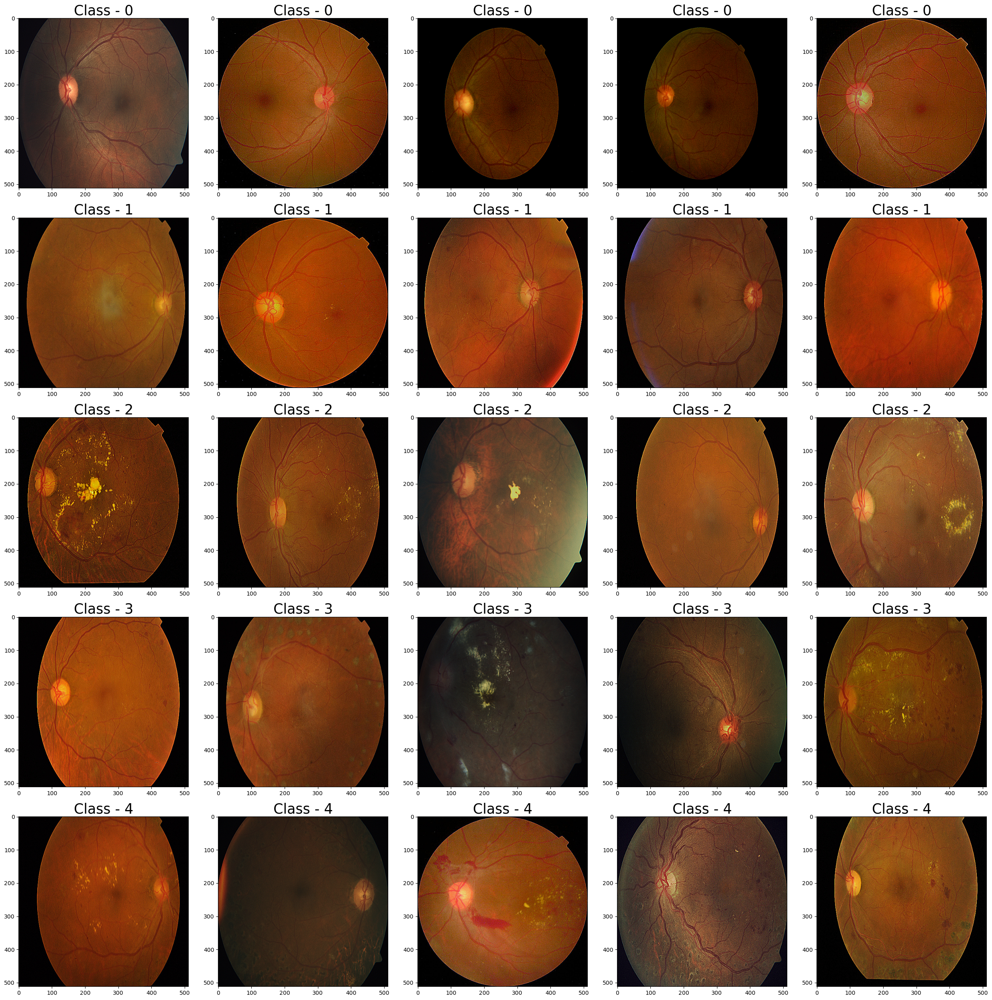

In [28]:
plt.figure(figsize=[25,25])
i = 1
for j in range(5):
    for item in train_csv[train_csv['diagnosis'] == j].id_code.sample(5):#.iloc[j]:
        img = str(item) + '.png'
        path = os.path.join(train_path, img)
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#         image = cv2.resize(image, (512, 512))
#         image=cv2.addWeighted (image,4, cv2.GaussianBlur( image , (0,0) , sigmaX=30) ,-4 ,128)
        trans = A.Compose([
                            A.Resize(height=512, width=512),
                            A.Sharpen(alpha=(0.2, 0.8), p=0.5),
                            ToTensorV2(),
                            ])
        image = trans(image = image)['image']
        plt.subplot(5,5,i)
        plt.title(f'Class - {j}', fontdict = {'fontsize' : 25})
        plt.imshow(image.permute(1, 2, 0))
        i += 1
plt.tight_layout()
plt.show()

In [29]:
train_dataset = ImageLoader_2(train, train_path, 'train')
test_dataset = ImageLoader_2(test, train_path, 'train')
val_dataset = ImageLoader_2(val, train_path, 'train')

Dataloader is used to split the data into batches. Several trials were done with batches and to manage the memory insufficiency a very minimal batch size of 1 is used and shuffle is done.

In [30]:
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=True)

### Model Building and validation 

Timm library is used to extract the pretrained models. 
Several pretrained models were used in trial and one such version SeResNext50_32x4d is shown below.

Here pretrained is maintained true to enable the model to bringforward the pretrained weights. Else only the architecture will be used by the model. So here some experiments were carried out with pretrained as true and false. 

In [31]:
seresnext_model = timm.create_model('seresnext50_32x4d', pretrained = True, num_classes = 5)

In [32]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(seresnext_model.parameters(), lr=0.00001)

In [33]:
seresnext_model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act1): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (act1): ReLU(inplace=True)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
      (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop_block): Identity()
      (act2): ReLU(inplace=True)
      (aa): Identity()
      (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_

Train and Test

Train, test and evaluation loops are built for sequential processing from loading the data till getting outputs. 

Initially a for loop is used to unpack the batches from the dataloader object. Unpacking is usually done as a batch from the train loader object. 

Steps to be maintained for proper backpropagation of losses:
- Initially the image arrays and labels are transfered to the device and then passed into the model.
- Outputs are backpropagated and then appended to calculate the metrics after each epoch.
- Then the model is converted to inference mode and evaluation of the model is done using the test and validation methods.

In [35]:
# Train and test

best_acc = 0
best_epoch = 0
def train(num_epoch, model):
    y_preds = []
    y_act = []
    losses = [0]
    for epoch in tqdm(range(num_epoch)):
        corr = 0
        least_loss = 0
        for train, labels in tqdm(train_loader):
            train, labels = train.to(device), labels.to(device)
            scores = model(train.float())
            loss = criterion(scores, labels)
            
            optimizer.zero_grad()
            losses.append(loss)
            loss.backward()
            optimizer.step()
            preds = np.argmax(np.array(scores.detach().to('cpu')),1)
            train_loss = criterion(scores, labels)
            y_preds.append(preds)
            y_act.extend(labels.detach().cpu().numpy())
        metric = cohen_kappa_score(y_act, y_preds)
        train_acc = accuracy_score(y_act, y_preds)
        if losses[-2]>loss.data:
            least_loss = metric
            torch.save(model.state_dict(),f'lessloss{epoch+1}_inc.pt')
#         ep_losses = losses / len(train_loader)
        
#         if epoch % 5 == 0:
        print(f'''Epoch {epoch+1}: Train     : The loss is {loss.data} 
                    kappa : {metric}, Train_accuracy: {train_acc*100} %''')
        
        test(model,epoch)
        evaluation(model)
        print('-'*110)

In [36]:
def evaluation(model):
    model.eval()
    test_loss = 0
    correct = 0
    y_preds = []
    y_act = []
    with torch.inference_mode():
        for x, y in tqdm(val_loader):
            x, y = x.to(device), y.to(device)
            output = model(x.float())
            predictions = np.argmax(np.array(output.detach().to('cpu')),1)
#             correct += (predictions == y).sum().item()
#             val_loss = criterion(output, y)
#             losses.append(val_loss)
            y_preds.append(predictions)
            y_act.extend(y.detach().cpu().numpy())
        metric = cohen_kappa_score(y_act, y_preds)
        val_acc = accuracy_score(y_act, y_preds)
#         ep_losses = sum(losses) / len(val_loader)
        
        print(f'\t Validation :kappa : {metric}, Validation_accuracy: {val_acc*100} %')

In [37]:
def test(model,epoch):
    global best_acc
    global best_epoch
#     global epoch
    model.eval()
    test_loss = 0
    correct = 0
    y_preds = []
    y_act = []
    with torch.inference_mode():
        for x, y in tqdm(test_loader):
            x, y = x.to(device), y.to(device)
            output = model(x.float())
            predictions = np.argmax(np.array(output.detach().to('cpu')),1)
#             correct += (predictions == y).sum().item()
#             test_loss = criterion(output, y)
#             losses.append(test_loss)
            y_preds.append(predictions)
            y_act.extend(y.detach().cpu().numpy())
        metric = cohen_kappa_score(y_act, y_preds)
        test_acc = accuracy_score(y_act, y_preds)
#         ep_losses = sum(losses) / len(train_loader)
        
        if best_acc<metric:
            best_acc = metric
            torch.save(model.state_dict(),f'bestacc{epoch+1}_inc.pt')
        print(f'\t Test      : kappa : {metric}, Test_accuracy: {test_acc*100} %')

In [38]:
def Cmatrix(rater_a, rater_b, min_rating=None, max_rating=None):
    assert(len(rater_a) == len(rater_b))
    if min_rating is None:
        min_rating = min(rater_a + rater_b)
    if max_rating is None:
        max_rating = max(rater_a + rater_b)
    num_ratings = int(max_rating - min_rating + 1)
    conf_mat = [[0 for i in range(num_ratings)]
                for j in range(num_ratings)]
    for a, b in zip(rater_a, rater_b):
        conf_mat[a - min_rating][b - min_rating] += 1
    return conf_mat

def histogram(ratings, min_rating=None, max_rating=None):
    if min_rating is None:
        min_rating = min(ratings)
    if max_rating is None:
        max_rating = max(ratings)
    num_ratings = int(max_rating - min_rating + 1)
    hist_ratings = [0 for x in range(num_ratings)]
    for r in ratings:
        hist_ratings[r - min_rating] += 1
    return hist_ratings

def quadratic_weighted_kappa(y, y_pred):
    rater_a = y
    rater_b = y_pred
    min_rating=None
    max_rating=None
    rater_a = np.array(rater_a, dtype=int)
    rater_b = np.array(rater_b, dtype=int)
    assert(len(rater_a) == len(rater_b))
    if min_rating is None:
        min_rating = min(min(rater_a), min(rater_b))
    if max_rating is None:
        max_rating = max(max(rater_a), max(rater_b))
    conf_mat = Cmatrix(rater_a, rater_b,
                                min_rating, max_rating)
    num_ratings = len(conf_mat)
    num_scored_items = float(len(rater_a))

    hist_rater_a = histogram(rater_a, min_rating, max_rating)
    hist_rater_b = histogram(rater_b, min_rating, max_rating)

    numerator = 0.0
    denominator = 0.0

    for i in range(num_ratings):
        for j in range(num_ratings):
            expected_count = (hist_rater_a[i] * hist_rater_b[j]
                              / num_scored_items)
            d = pow(i - j, 2.0) / pow(num_ratings - 1, 2.0)
            numerator += d * conf_mat[i][j] / num_scored_items
            denominator += d * expected_count / num_scored_items

    return (1.0 - numerator / denominator)

In [ ]:
%%time
torch.manual_seed(42) 
torch.cuda.manual_seed(42)
train(15,seresnext_model) 

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/2563 [00:00<?, ?it/s]

Epoch 1: Train     : The loss is 0.06113767996430397 
                    kappa : 0.286605699299901, Train_accuracy: 60.04682013265704 %


  0%|          | 0/549 [00:00<?, ?it/s]

	 Test      : kappa : 0.09325371617329437, Test_accuracy: 36.0655737704918 %


  0%|          | 0/550 [00:00<?, ?it/s]

	 Validation :kappa : 0.07260742935976705, Validation_accuracy: 34.0 %
--------------------------------------------------------------------------------------------------------------


  0%|          | 0/2563 [00:00<?, ?it/s]

Epoch 2: Train     : The loss is 0.0011449456214904785 
                    kappa : 0.4509629202167985, Train_accuracy: 67.49902458056964 %


  0%|          | 0/549 [00:00<?, ?it/s]

	 Test      : kappa : 0.6872900262121124, Test_accuracy: 80.32786885245902 %


  0%|          | 0/550 [00:00<?, ?it/s]

	 Validation :kappa : 0.7026609763324375, Validation_accuracy: 81.0909090909091 %
--------------------------------------------------------------------------------------------------------------


  0%|          | 0/2563 [00:00<?, ?it/s]

Epoch 3: Train     : The loss is 0.009407240897417068 
                    kappa : 0.5303261761412609, Train_accuracy: 71.45272467160879 %


  0%|          | 0/549 [00:00<?, ?it/s]

	 Test      : kappa : 0.6782310057273297, Test_accuracy: 79.23497267759562 %


  0%|          | 0/550 [00:00<?, ?it/s]

	 Validation :kappa : 0.6720856483504059, Validation_accuracy: 78.9090909090909 %
--------------------------------------------------------------------------------------------------------------


  0%|          | 0/2563 [00:00<?, ?it/s]

Epoch 4: Train     : The loss is 0.557249903678894 
                    kappa : 0.5811266573922464, Train_accuracy: 74.10261412407336 %


  0%|          | 0/549 [00:00<?, ?it/s]

	 Test      : kappa : 0.6907073094123454, Test_accuracy: 79.41712204007287 %


  0%|          | 0/550 [00:00<?, ?it/s]

	 Validation :kappa : 0.685874891033156, Validation_accuracy: 79.27272727272727 %
--------------------------------------------------------------------------------------------------------------


  0%|          | 0/2563 [00:00<?, ?it/s]

Epoch 5: Train     : The loss is 0.0017774987500160933 
                    kappa : 0.6186549104706822, Train_accuracy: 76.16074912212252 %


  0%|          | 0/549 [00:00<?, ?it/s]

	 Test      : kappa : 0.7724160167045385, Test_accuracy: 85.24590163934425 %


  0%|          | 0/550 [00:00<?, ?it/s]

	 Validation :kappa : 0.7562986243495287, Validation_accuracy: 84.36363636363636 %
--------------------------------------------------------------------------------------------------------------


  0%|          | 0/2563 [00:00<?, ?it/s]

Epoch 6: Train     : The loss is 0.1596512347459793 
                    kappa : 0.647972175566216, Train_accuracy: 77.82546494992847 %


  0%|          | 0/549 [00:00<?, ?it/s]

	 Test      : kappa : 0.7804789164401658, Test_accuracy: 85.61020036429873 %


  0%|          | 0/550 [00:00<?, ?it/s]

	 Validation :kappa : 0.7643842882059546, Validation_accuracy: 84.72727272727273 %
--------------------------------------------------------------------------------------------------------------


  0%|          | 0/2563 [00:00<?, ?it/s]

Epoch 7: Train     : The loss is 0.9007014036178589 
                    kappa : 0.6756530247789051, Train_accuracy: 79.4437322334318 %


  0%|          | 0/549 [00:00<?, ?it/s]

	 Test      : kappa : 0.7286714979499826, Test_accuracy: 82.14936247723132 %


  0%|          | 0/550 [00:00<?, ?it/s]

	 Validation :kappa : 0.7005591936214275, Validation_accuracy: 80.54545454545455 %
--------------------------------------------------------------------------------------------------------------


  0%|          | 0/2563 [00:00<?, ?it/s]

Epoch 8: Train     : The loss is 0.054328542202711105 
                    kappa : 0.6993176994148158, Train_accuracy: 80.85251658213032 %


  0%|          | 0/549 [00:00<?, ?it/s]

	 Test      : kappa : 0.7793610418680368, Test_accuracy: 85.61020036429873 %


  0%|          | 0/550 [00:00<?, ?it/s]

	 Validation :kappa : 0.7579572203459215, Validation_accuracy: 84.36363636363636 %
--------------------------------------------------------------------------------------------------------------


  0%|          | 0/2563 [00:00<?, ?it/s]

Epoch 9: Train     : The loss is 1.1920928244535389e-07 
                    kappa : 0.7221648320626259, Train_accuracy: 82.23436077513331 %


  0%|          | 0/549 [00:00<?, ?it/s]

	 Test      : kappa : 0.7662403619742371, Test_accuracy: 84.8816029143898 %


  0%|          | 0/550 [00:00<?, ?it/s]

	 Validation :kappa : 0.753641320297175, Validation_accuracy: 84.18181818181819 %
--------------------------------------------------------------------------------------------------------------


  0%|          | 0/2563 [00:00<?, ?it/s]

Epoch 10: Train     : The loss is 1.2755313036905136e-05 
                    kappa : 0.7421782190996403, Train_accuracy: 83.4568864611783 %


  0%|          | 0/549 [00:00<?, ?it/s]

	 Test      : kappa : 0.6940106651134298, Test_accuracy: 79.78142076502732 %


  0%|          | 0/550 [00:00<?, ?it/s]

	 Validation :kappa : 0.6764461874952863, Validation_accuracy: 78.72727272727272 %
--------------------------------------------------------------------------------------------------------------


  0%|          | 0/2563 [00:00<?, ?it/s]

Epoch 11: Train     : The loss is 0.14162369072437286 
                    kappa : 0.7600139166225877, Train_accuracy: 84.55645018266945 %


  0%|          | 0/549 [00:00<?, ?it/s]

	 Test      : kappa : 0.7719764773815132, Test_accuracy: 85.06375227686704 %


  0%|          | 0/550 [00:00<?, ?it/s]

	 Validation :kappa : 0.7549528385473361, Validation_accuracy: 84.0 %
--------------------------------------------------------------------------------------------------------------


  0%|          | 0/2563 [00:00<?, ?it/s]


KeyboardInterrupt



Interupted due to GPU limit exception. Will keep an eye on it moving forward.

# Conclusion

MODEL : **SeResNext50_32x4d**

DATA : **Resized to 512 x 512, Converted to Tensor, Sharpen**

KAPPA SCORE :
 - Train : 0.74217
 - Test : 0.69401
 - Validation : 0.67644
 - PRIVATE : 0.863467
 - PUBLIC : 0.649313

# WayForward

Data Spread across classes in the best model

| Data |  0 | 2 | 1 | 3 | 4 |
| ----- | -------------- | ------------- | ------------------- | ------------ | ------------- |
|   Train   | 65% | 19% | 7.9% | 3.4% | 4.1% |
|  Prediction  |  17% | 63% | 6.3% | 9.9% | 3.6% |

So the inconsistency in the prediction and train data spread can be sorted in upcoming trials for better results.

- With some more epochs I probably believe the models can run well.
- Also the data spread inconsistency can be killed to also yield better results.
- Trials with some more augmentation or model architecture updates can yield better results.